Image RGB détectée.


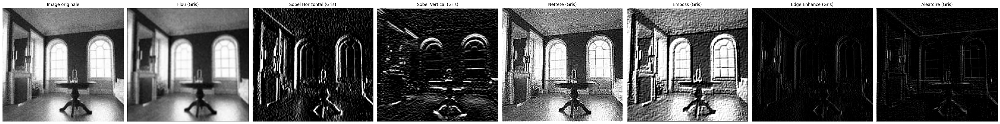

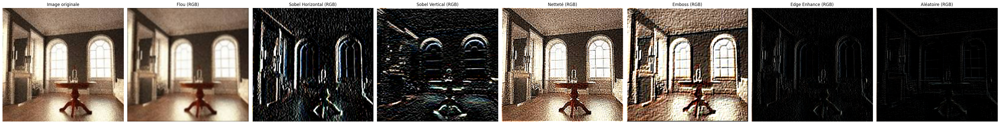

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os

def image_load(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
    assert image is not None, "Erreur : Impossible de charger l'image"

    if len(image.shape) == 2:
        print("Image en niveaux de gris détectée.")
        return image
    elif len(image.shape) == 3 and image.shape[2] == 3:
        print("Image RGB détectée.")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        return image
    else:
        raise ValueError("Format d'image non supporté.")


def convolve_channel(image, kernel):
    assert image.shape[0] >= kernel.shape[0], "L’image est trop petite pour le noyau en hauteur"
    assert image.shape[1] >= kernel.shape[1], "L’image est trop petite pour le noyau en largeur"

    img_height, img_width = image.shape
    kernel_height, kernel_width = kernel.shape
    pad_h, pad_w = kernel_height // 2, kernel_width // 2

    padded_image = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')
    output = np.zeros_like(image, dtype=np.float32)

    for i in range(img_height):
        for j in range(img_width):
            region = padded_image[i:i+kernel_height, j:j+kernel_width]
            output[i, j] = np.sum(region * kernel)

    assert output.shape == image.shape, "Erreur : la taille de sortie ne correspond pas à l'entrée"
    return output


def apply_convolution(image, kernel):
    assert isinstance(image, np.ndarray), "L’image doit être un tableau NumPy"
    assert isinstance(kernel, np.ndarray), "Le noyau doit être un tableau NumPy"
    assert len(kernel.shape) == 2, "Le noyau doit être une matrice 2D"
    assert kernel.shape[0] == kernel.shape[1], "Le noyau doit être carré"
    assert kernel.shape[0] % 2 == 1, "Le noyau doit avoir une taille impaire"
    assert len(image.shape) in [2, 3], "L’image doit être en niveaux de gris (2D) ou RGB (3D)"

    if len(image.shape) == 3:
        assert image.shape[2] == 3, "L’image RGB doit avoir 3 canaux"
        height, width, channels = image.shape
        output = np.zeros_like(image, dtype=np.float32)
        for c in range(channels):
            output[:, :, c] = convolve_channel(image[:, :, c], kernel)
    else:
        output = convolve_channel(image, kernel)

    output = np.clip(output, 0, 255).astype(np.uint8)
    assert output.shape == image.shape, "Erreur : la taille de sortie ne correspond pas à l'entrée"
    return output


def display_images(original, filtered_list, titles):
    n = len(filtered_list) + 1
    plt.figure(figsize=(5 * n, 5))

    plt.subplot(1, n, 1)
    plt.title("Image originale")
    cmap = 'gray' if len(original.shape) == 2 else None
    plt.imshow(original, cmap=cmap)
    plt.axis('off')

    for i, (filtered, title) in enumerate(zip(filtered_list, titles), start=2):
        plt.subplot(1, n, i)
        plt.title(title)
        cmap = 'gray' if len(filtered.shape) == 2 else None
        plt.imshow(filtered, cmap=cmap)
        plt.axis('off')

    plt.tight_layout()
    plt.show()


np.random.seed(42)
blur_kernel = np.ones((3, 3)) / 9
sobel_horizontal = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
sobel_vertical = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
sharpen_kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
emboss_kernel = np.array([[-2, -1, 0], [-1, 1, 1], [0, 1, 2]])
edge_enhance = np.array([[0, 0, 0], [-1, 1, 0], [0, 0, 0]])
random_kernel = np.random.rand(3, 3) - 0.5

filters = {
    "Flou": blur_kernel,
    "Sobel Horizontal": sobel_horizontal,
    "Sobel Vertical": sobel_vertical,
    "Netteté": sharpen_kernel,
    "Emboss": emboss_kernel,
    "Edge Enhance": edge_enhance,
    "Aléatoire": random_kernel
}


image_path = "image.jpeg"  
image = image_load(image_path)

gray_image = image if len(image.shape) == 2 else cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
rgb_image = image if len(image.shape) == 3 else cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)

output_dir = "output_results"
os.makedirs(output_dir, exist_ok=True)

gray_results = []
gray_titles = []
for name, kernel in filters.items():
    result = apply_convolution(gray_image, kernel)
    gray_results.append(result)
    gray_titles.append(f"{name} (Gris)")

rgb_results = []
rgb_titles = []
for name, kernel in filters.items():
    result = apply_convolution(rgb_image, kernel)
    rgb_results.append(result)
    rgb_titles.append(f"{name} (RGB)")

display_images(gray_image, gray_results, gray_titles)
display_images(rgb_image, rgb_results, rgb_titles)


for name, result in zip(gray_titles, gray_results):
    filename = name.lower().replace(' ', '_') + ".jpg"
    cv2.imwrite(os.path.join(output_dir, filename), result)

for name, result in zip(rgb_titles, rgb_results):
    filename = name.lower().replace(' ', '_') + ".jpg"
    cv2.imwrite(os.path.join(output_dir, filename), cv2.cvtColor(result, cv2.COLOR_RGB2BGR))


Image RGB détectée.


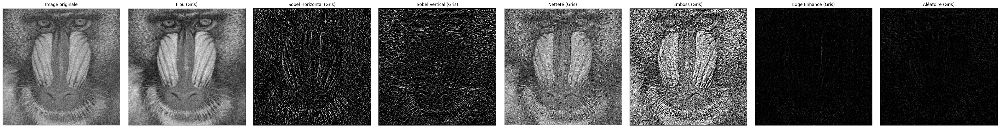

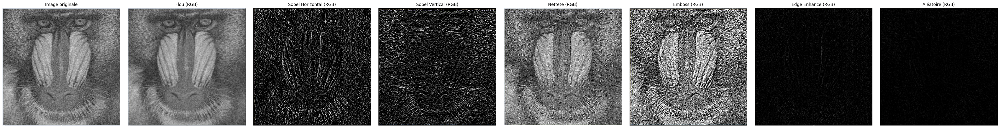

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os

def image_load(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
    assert image is not None, "Erreur : Impossible de charger l'image"

    if len(image.shape) == 2:
        print("Image en niveaux de gris détectée.")
        return image
    elif len(image.shape) == 3 and image.shape[2] == 3:
        print("Image RGB détectée.")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        return image
    else:
        raise ValueError("Format d'image non supporté.")


def convolve_channel(image, kernel):
    assert image.shape[0] >= kernel.shape[0], "L’image est trop petite pour le noyau en hauteur"
    assert image.shape[1] >= kernel.shape[1], "L’image est trop petite pour le noyau en largeur"

    img_height, img_width = image.shape
    kernel_height, kernel_width = kernel.shape
    pad_h, pad_w = kernel_height // 2, kernel_width // 2

    padded_image = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')
    output = np.zeros_like(image, dtype=np.float32)

    for i in range(img_height):
        for j in range(img_width):
            region = padded_image[i:i+kernel_height, j:j+kernel_width]
            output[i, j] = np.sum(region * kernel)

    assert output.shape == image.shape, "Erreur : la taille de sortie ne correspond pas à l'entrée"
    return output


def apply_convolution(image, kernel):
    assert isinstance(image, np.ndarray), "L’image doit être un tableau NumPy"
    assert isinstance(kernel, np.ndarray), "Le noyau doit être un tableau NumPy"
    assert len(kernel.shape) == 2, "Le noyau doit être une matrice 2D"
    assert kernel.shape[0] == kernel.shape[1], "Le noyau doit être carré"
    assert kernel.shape[0] % 2 == 1, "Le noyau doit avoir une taille impaire"
    assert len(image.shape) in [2, 3], "L’image doit être en niveaux de gris (2D) ou RGB (3D)"

    if len(image.shape) == 3:
        assert image.shape[2] == 3, "L’image RGB doit avoir 3 canaux"
        height, width, channels = image.shape
        output = np.zeros_like(image, dtype=np.float32)
        for c in range(channels):
            output[:, :, c] = convolve_channel(image[:, :, c], kernel)
    else:
        output = convolve_channel(image, kernel)

    output = np.clip(output, 0, 255).astype(np.uint8)
    assert output.shape == image.shape, "Erreur : la taille de sortie ne correspond pas à l'entrée"
    return output


def display_images(original, filtered_list, titles):
    n = len(filtered_list) + 1
    plt.figure(figsize=(5 * n, 5))

    plt.subplot(1, n, 1)
    plt.title("Image originale")
    cmap = 'gray' if len(original.shape) == 2 else None
    plt.imshow(original, cmap=cmap)
    plt.axis('off')

    for i, (filtered, title) in enumerate(zip(filtered_list, titles), start=2):
        plt.subplot(1, n, i)
        plt.title(title)
        cmap = 'gray' if len(filtered.shape) == 2 else None
        plt.imshow(filtered, cmap=cmap)
        plt.axis('off')

    plt.tight_layout()
    plt.show()


np.random.seed(42)
blur_kernel = np.ones((3, 3)) / 9
sobel_horizontal = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
sobel_vertical = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
sharpen_kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
emboss_kernel = np.array([[-2, -1, 0], [-1, 1, 1], [0, 1, 2]])
edge_enhance = np.array([[0, 0, 0], [-1, 1, 0], [0, 0, 0]])
random_kernel = np.random.rand(3, 3) - 0.5

filters = {
    "Flou": blur_kernel,
    "Sobel Horizontal": sobel_horizontal,
    "Sobel Vertical": sobel_vertical,
    "Netteté": sharpen_kernel,
    "Emboss": emboss_kernel,
    "Edge Enhance": edge_enhance,
    "Aléatoire": random_kernel
}


image_path = "imag.jpg"  
image = image_load(image_path)

gray_image = image if len(image.shape) == 2 else cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
rgb_image = image if len(image.shape) == 3 else cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)

output_dir = "output_results"
os.makedirs(output_dir, exist_ok=True)

gray_results = []
gray_titles = []
for name, kernel in filters.items():
    result = apply_convolution(gray_image, kernel)
    gray_results.append(result)
    gray_titles.append(f"{name} (Gris)")

rgb_results = []
rgb_titles = []
for name, kernel in filters.items():
    result = apply_convolution(rgb_image, kernel)
    rgb_results.append(result)
    rgb_titles.append(f"{name} (RGB)")

display_images(gray_image, gray_results, gray_titles)
display_images(rgb_image, rgb_results, rgb_titles)


for name, result in zip(gray_titles, gray_results):
    filename = name.lower().replace(' ', '_') + ".jpg"
    cv2.imwrite(os.path.join(output_dir, filename), result)

for name, result in zip(rgb_titles, rgb_results):
    filename = name.lower().replace(' ', '_') + ".jpg"
    cv2.imwrite(os.path.join(output_dir, filename), cv2.cvtColor(result, cv2.COLOR_RGB2BGR))
